# Load Library

In [ ]:
!pip install transformers[torch]
!pip install accelerate -U
!pip install datasets[audio]
!pip install evaluate
!pip install jiwer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.6/297.6 kB 2.6 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [ ]:
!pip install rouge

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display as ipd
import json
import random
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.translate import bleu_score
from IPython.display import display, HTML

import torch
from transformers import (
    WhisperConfig,
    WhisperProcessor,
    WhisperFeatureExtractor,
    WhisperTokenizer,
    WhisperForConditionalGeneration,
    Seq2SeqTrainer,
    Seq2SeqTrainingArguments,
    Trainer,
    TrainingArguments,
    DataCollatorWithPadding,
    AdamW,
    pipeline,
    send_example_telemetry
)
from transformers.utils import logging
from dataclasses import dataclass, field
from typing import Any, Dict, List, Optional, Union
from datasets import (
    load_dataset,
    load_metric,
    ClassLabel,
    Audio,
    DatasetDict,
    concatenate_datasets
)

# Download NLTK punkt tokenizer
nltk.download('punkt')

# Set logging level to WARNING to reduce verbosity
logging.set_verbosity_warning()


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

# Load Dataset

We use 3 dataset from english US AU GB

In [ ]:
!huggingface-cli download PolyAI/minds14 --repo-type dataset --revision refs/convert/parquet --local-dir . --local-dir-use-symlinks False  --include 'en-US/*'
!huggingface-cli download PolyAI/minds14 --repo-type dataset --revision refs/convert/parquet --local-dir . --local-dir-use-symlinks False  --include 'en-AU/*'
!huggingface-cli download PolyAI/minds14 --repo-type dataset --revision refs/convert/parquet --local-dir . --local-dir-use-symlinks False  --include 'en-GB/*'

minds_enUS = load_dataset('./en-US', split="train")
minds_enAU = load_dataset('./en-AU', split="train")
minds_enGB = load_dataset('./en-GB', split="train")

Consider using `hf_transfer` for faster downloads. This solution comes with some limitations. See https://huggingface.co/docs/huggingface_hub/hf_transfer for more details.
Fetching 1 files:   0% 0/1 [00:00<?, ?it/s]downloading https://huggingface.co/datasets/PolyAI/minds14/resolve/eccc1d790caefb22ddbdbdd568aa5867c5a3aa00/en-US/train/0000.parquet to /root/.cache/huggingface/hub/tmp5sj48kn4

en-US/train/0000.parquet:   0% 0.00/34.2M [00:00<?, ?B/s]
en-US/train/0000.parquet:  31% 10.5M/34.2M [00:00<00:00, 60.1MB/s]
en-US/train/0000.parquet: 100% 34.2M/34.2M [00:00<00:00, 76.2MB/s]
Fetching 1 files: 100% 1/1 [00:01<00:00,  1.01s/it]
/content
Consider using `hf_transfer` for faster downloads. This solution comes with some limitations. See https://huggingface.co/docs/huggingface_hub/hf_transfer for more details.
Fetching 1 files:   0% 0/1 [00:00<?, ?it/s]downloading https://huggingface.co/datasets/PolyAI/minds14/resolve/eccc1d790caefb22ddbdbdd568aa5867c5a3aa00/en-AU/train/0000.parquet to /ro

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

In [ ]:
print(minds_enUS)
print(minds_enAU)
print(minds_enGB)

Dataset({
    features: ['path', 'audio', 'transcription', 'english_transcription', 'intent_class', 'lang_id'],
    num_rows: 563
})
Dataset({
    features: ['path', 'audio', 'transcription', 'english_transcription', 'intent_class', 'lang_id'],
    num_rows: 654
})
Dataset({
    features: ['path', 'audio', 'transcription', 'english_transcription', 'intent_class', 'lang_id'],
    num_rows: 592
})


## Merge Dataset

In [ ]:
merged_dataset = concatenate_datasets([minds_enUS, minds_enAU, minds_enGB])

print(merged_dataset)

Dataset({
    features: ['path', 'audio', 'transcription', 'english_transcription', 'intent_class', 'lang_id'],
    num_rows: 1809
})


# Exploratory Datasets

Distribusi dari Intention, ada 14 nilai yang berbda

* 0  = abroad
* 1  = adress
* 2  = app_error
* 3  = atm_limit
* 4  =balance
* 5  = business_loan
* 6  =card_issues
* 7  = cash_deposite
* 8  =direct_debit
* 9  =freeze
* 10 =latest_transactions
* 11 =joint_account
* 12 =high_value_payment
* 13 =pay_bill

In [ ]:
intent_classes = [
    {'index': 0, 'name': 'abroad'},
    {'index': 1, 'name': 'adress'},
    {'index': 2, 'name': 'app_error'},
    {'index': 3, 'name': 'atm_limit'},
    {'index': 4, 'name': 'balance'},
    {'index': 5, 'name': 'business_loan'},
    {'index': 6, 'name': 'card_issues'},
    {'index': 7, 'name': 'cash_deposite'},
    {'index': 8, 'name': 'direct_debit'},
    {'index': 9, 'name': 'freeze'},
    {'index': 10, 'name': 'latest_transactions'},
    {'index': 11, 'name': 'joint_account'},
    {'index': 12, 'name': 'high_value_payment'},
    {'index': 13, 'name': 'pay_bill'}
]

def plot_label_distribution(dataset):
    # Extract intent_class labels
    labels = dataset['intent_class']

    # Count the frequency of each label
    label_counts = {}
    for label in labels:
        if label in label_counts:
            label_counts[label] += 1
        else:
            label_counts[label] = 1

    # Sort labels by their counts in descending order
    sorted_labels = sorted(label_counts.items(), key=lambda x: x[1], reverse=True)
    sorted_labels = [{'name': intent_classes[label[0]]['name'], 'index': intent_classes[label[0]]['index'], 'count': label[1]} for label in sorted_labels]

    # Create x-axis labels combining name and index
    x_labels = [f"{label['name']} ({label['index']})" for label in sorted_labels]
    counts = [label['count'] for label in sorted_labels]

    # Plot distribution
    plt.figure(figsize=(12, 6))
    plt.bar(x_labels, counts, color='skyblue')
    plt.xlabel('Intent Class')
    plt.ylabel('Frequency')
    plt.title('Distribution of Intent Classes')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

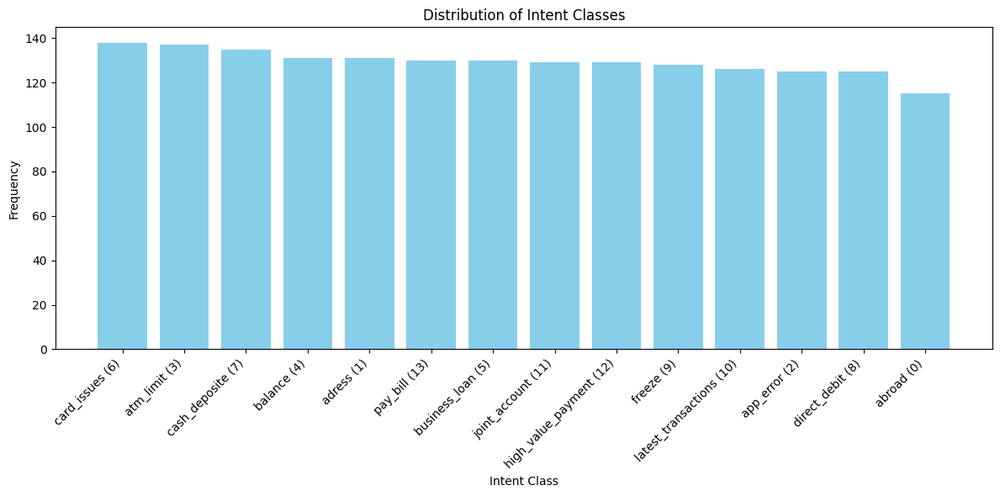

In [ ]:
plot_label_distribution(merged_dataset)

# Waveplot adn Spectogram Visualization

In [ ]:
import IPython.display as ipd
from IPython.core.display import display

def plot_waveform_and_spectrogram(dataset, intent_class, name_intent):
    """
    Plot the waveform and spectrogram of audio samples filtered by a specific intent class.

    Parameters:
    - dataset (list): List of dictionaries representing audio samples with associated metadata.
    - intent_class (str): The intent class to filter the dataset.
    - name_intent (str): Name or label of the intent class for display purposes.

    """

    # Filter dataset for a specific intent_class
    filtered_data = [example for example in dataset if example['intent_class'] == intent_class]

    # Ensure at least one sample exists for the specified intent class
    if not filtered_data:
        print(f"No samples found for intent class: {intent_class}")
        return

    # Take the first audio sample for the given intent_class
    sample = filtered_data[0]

    # Extract audio array and sampling rate
    audio_array = sample['audio']['array']
    sr = sample['audio']['sampling_rate']

    # Display Audio (commented out for now)
    # ipd.Audio(data=np.asarray(sample['audio']['array']), rate=8000)

    print("Transcription:", sample['transcription'])

    # Plot Waveform
    plt.figure(figsize=(20, 8))
    plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
    librosa.display.waveshow(audio_array, sr=sr)
    plt.title(f'Waveform for Intent Class: {intent_class} - {name_intent}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')

    # Compute and plot Spectrogram
    plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
    X = librosa.stft(audio_array)
    Xdb = librosa.amplitude_to_db(abs(X))
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar()
    plt.title(f'Spectrogram for Intent Class: {intent_class} - {name_intent}')

    plt.tight_layout()
    plt.show()

Transcription: yes I'm going to be traveling to the United Kingdom for a couple of weeks next month I need to know if I can use my card from from my bank account while I'm in Europe


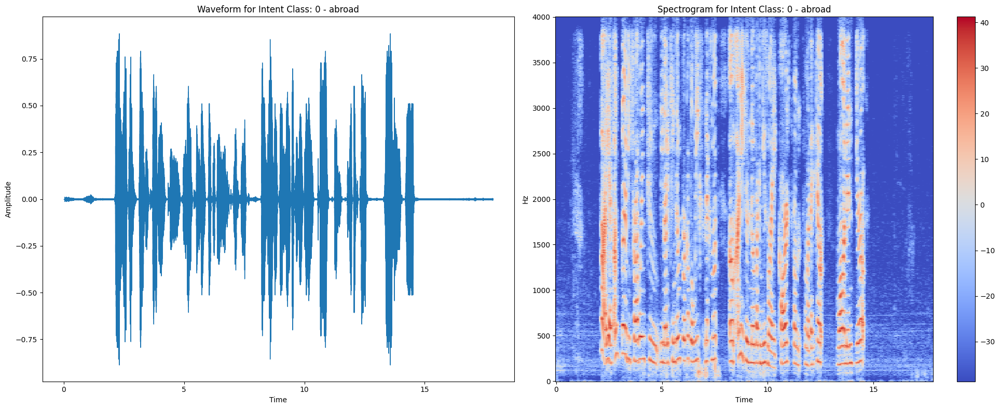

Transcription: hi yes I like to change my address


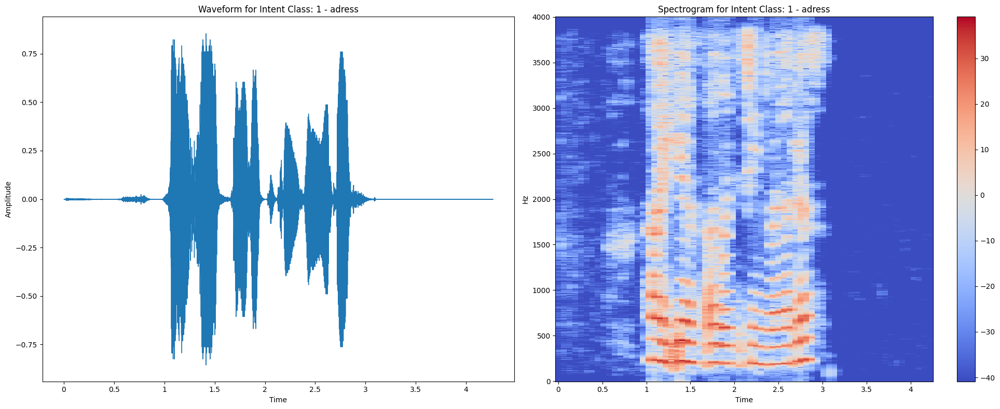

Transcription: high on the app isn't loading information


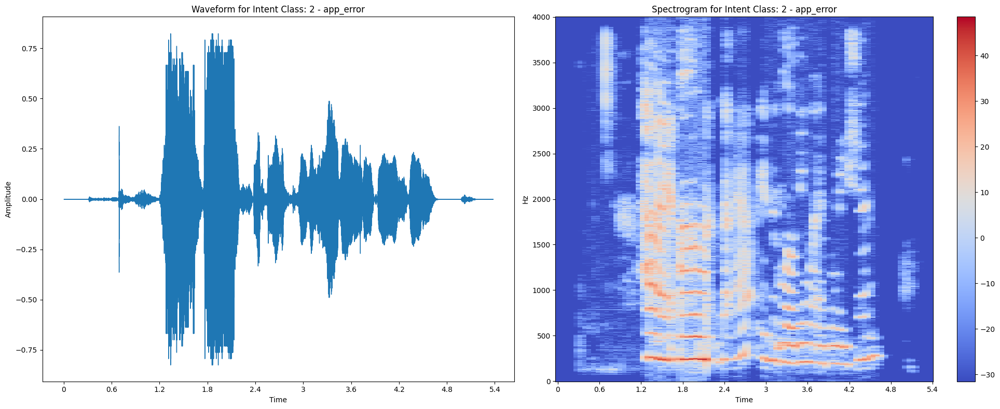

Transcription: how much money can I withdraw per day from the ATM


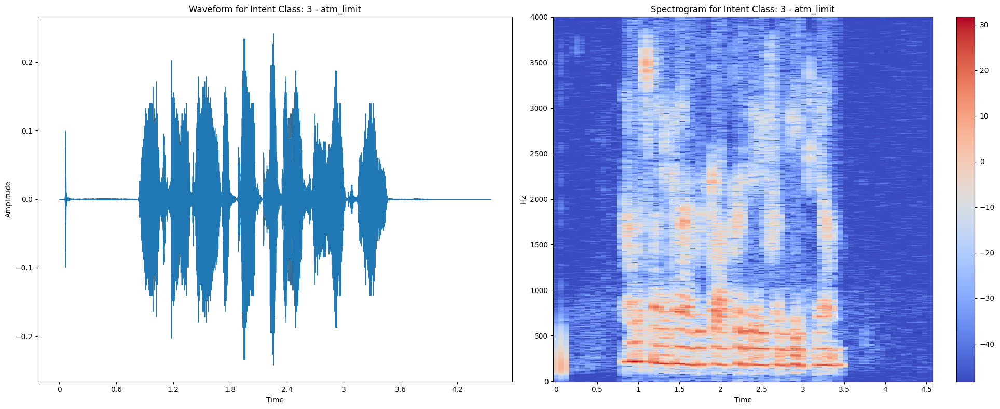

Transcription: what is my account balance


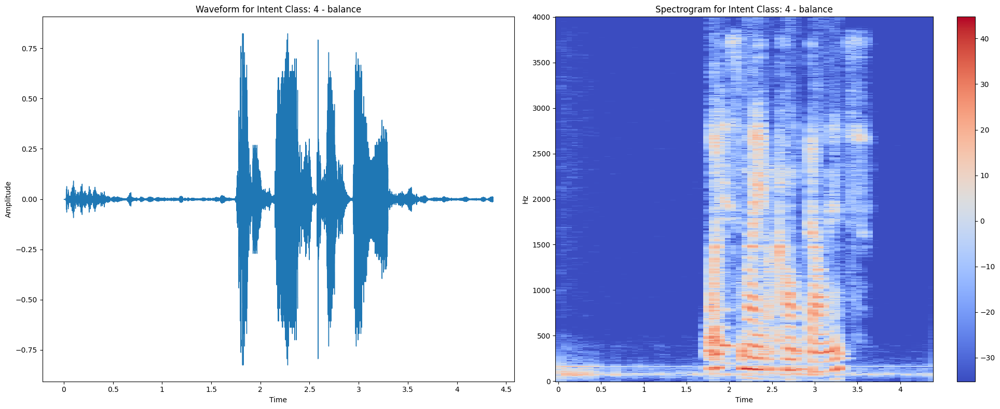

Transcription: I'm calling to inquire about a business loan


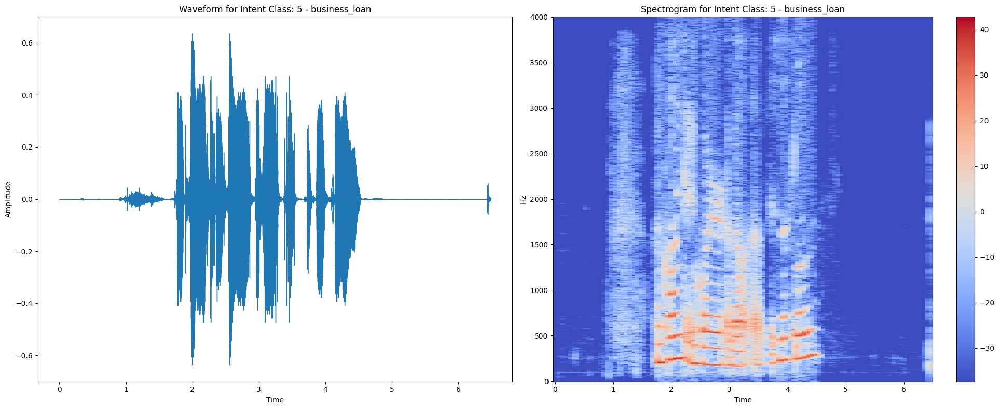

Transcription: I'm trying to say something is my car doesn't seem to work whenever I called do it it doesn't actually work


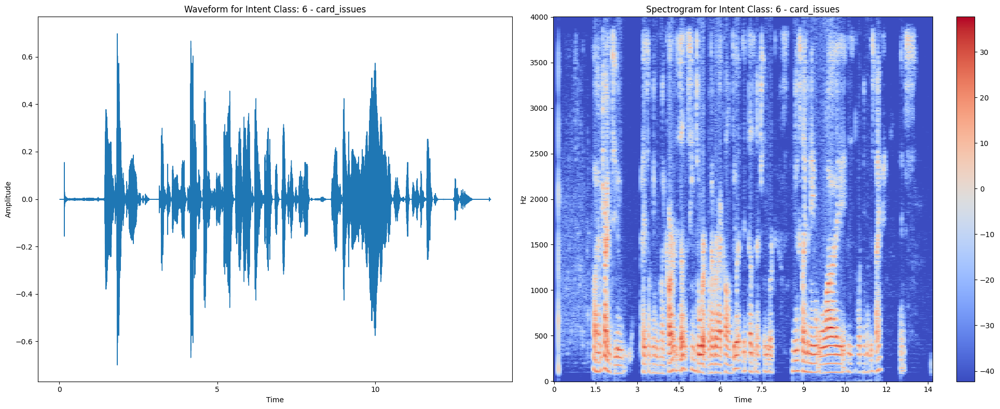

Transcription: transfer money to the account


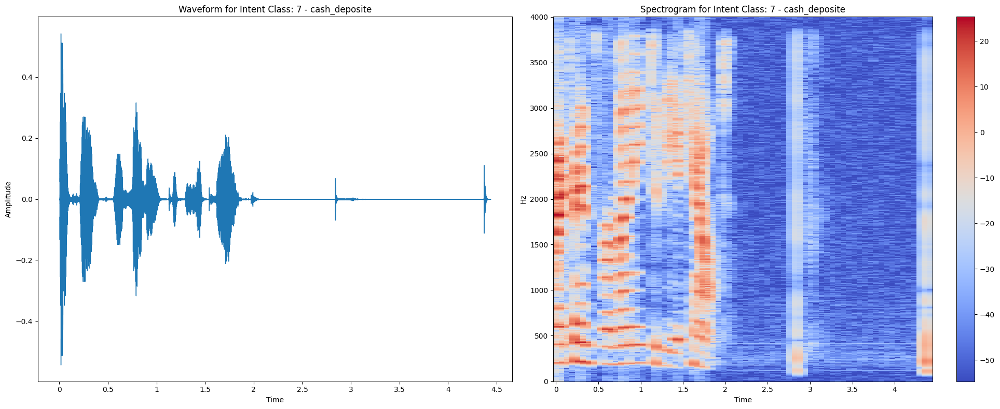

Transcription: I'm having trouble understanding what a direct debit is to provide through Clarity and information for me


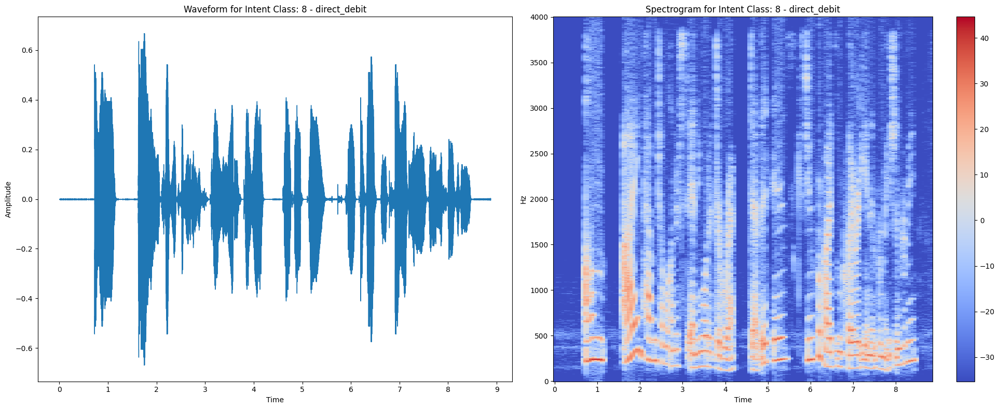

Transcription: oh yeah hi I need fastest topical transactions on my card freeze my card block my card or something


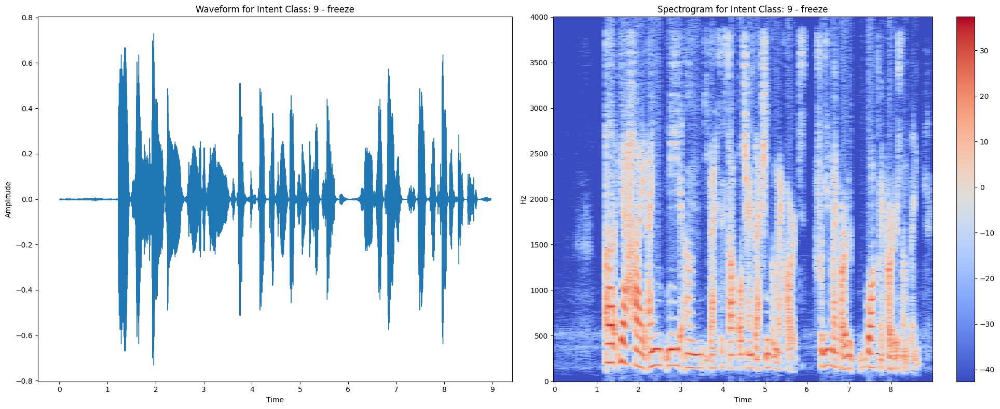

Transcription: how do I confirm a large email with a text message


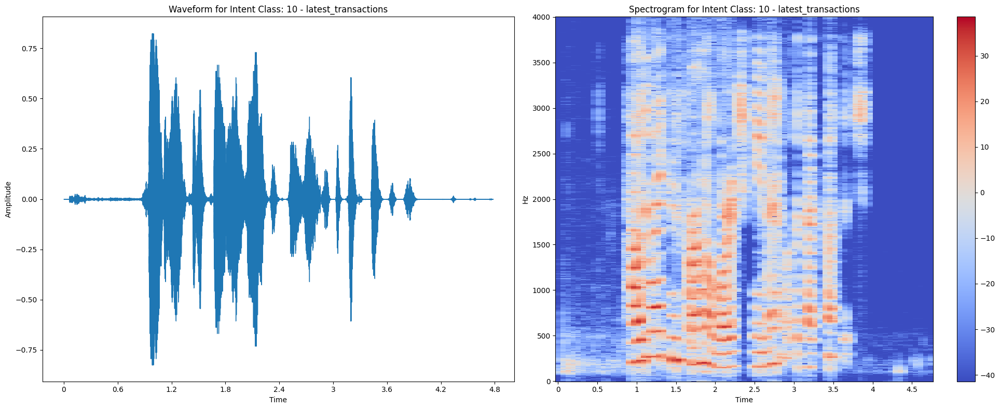

Transcription: I would like to set up a joint account with my partner


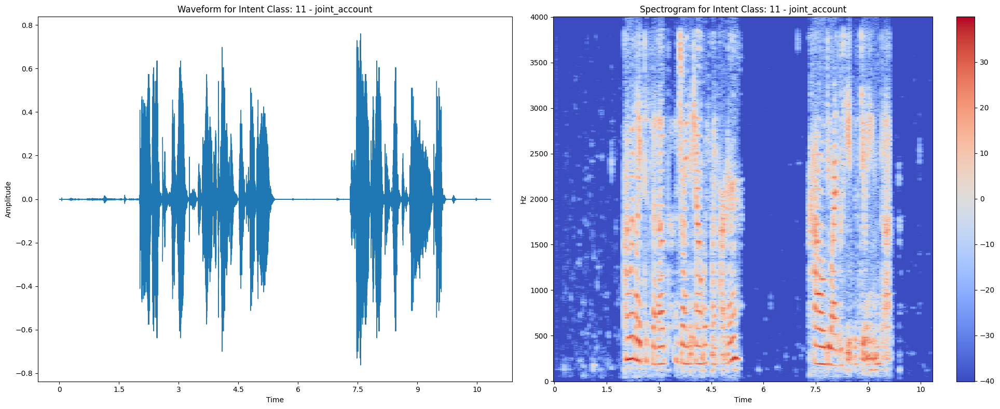

Transcription: tell me about recent transactions on my card


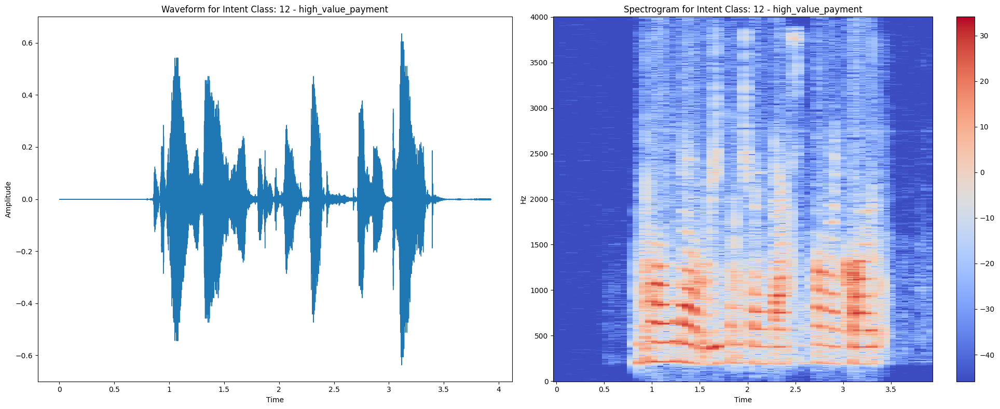

Transcription: I would like to make a down payment


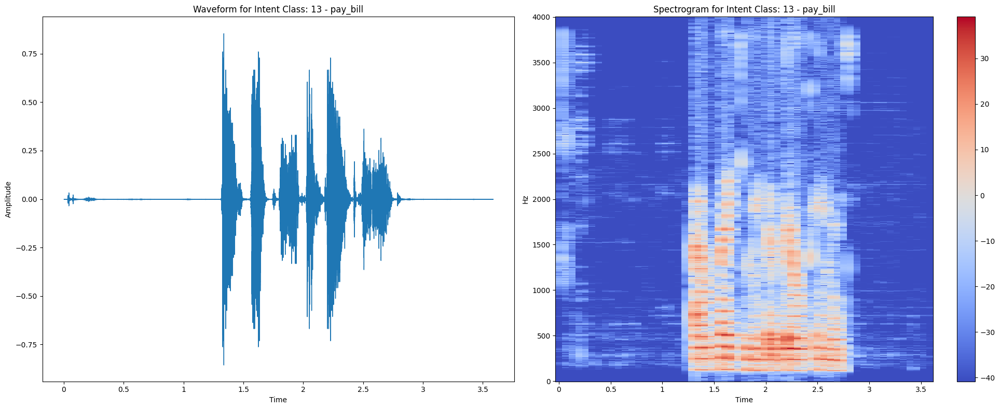

In [ ]:
for intent in range(len(intent_classes)):
  plot_waveform_and_spectrogram(merged_dataset, intent, intent_classes[intent]['name'])

In [ ]:
merged_dataset.features

{'path': Value(dtype='string', id=None),
 'audio': Audio(sampling_rate=8000, mono=True, decode=True, id=None),
 'transcription': Value(dtype='string', id=None),
 'english_transcription': Value(dtype='string', id=None),
 'intent_class': ClassLabel(names=['abroad', 'address', 'app_error', 'atm_limit', 'balance', 'business_loan', 'card_issues', 'cash_deposit', 'direct_debit', 'freeze', 'high_value_payment', 'joint_account', 'latest_transactions', 'pay_bill'], id=None),
 'lang_id': ClassLabel(names=['cs-CZ', 'de-DE', 'en-AU', 'en-GB', 'en-US', 'es-ES', 'fr-FR', 'it-IT', 'ko-KR', 'nl-NL', 'pl-PL', 'pt-PT', 'ru-RU', 'zh-CN'], id=None)}

In [ ]:
print(merged_dataset['path'][0])
print(merged_dataset['audio'][0])
print(merged_dataset['transcription'][0])
print(merged_dataset['english_transcription'][0])
print(merged_dataset['intent_class'][0])
print(merged_dataset['lang_id'][0])

/storage/hf-datasets-cache/all/datasets/51125457981586-config-parquet-and-info-PolyAI-minds14-efce24e3/downloads/extracted/cfd42a9443ffb9548ee39e3c64f8b512ca72b9ce5e2ea6b981d44ba6c7265ae8/en-US~JOINT_ACCOUNT/602ba55abb1e6d0fbce92065.wav
{'path': '602ba55abb1e6d0fbce92065.wav', 'array': array([ 0.        ,  0.00024414, -0.00024414, ..., -0.00024414,
        0.        ,  0.        ]), 'sampling_rate': 8000}
I would like to set up a joint account with my partner
I would like to set up a joint account with my partner
11
4


## Checking the Null

In [ ]:
def count_feature_lengths(dataset):
    """
    Count the lengths of values in each feature of the dataset.

    Args:
    - dataset: A dataset containing various features.

    Returns:
    - feature_lengths: A dictionary mapping each feature to a list of lengths of its values.
    """
    feature_lengths = {}

    # Iterate over each feature in the dataset
    for feature in dataset.features:
        # Get the values for the current feature
        values = dataset[feature]

        # Calculate the lengths of values, treating non-string values as length 1
        lengths = [len(str(value)) if not isinstance(value, (int, float, dict, list)) else 1 for value in values]

        # Store the lengths for the current feature in the dictionary
        feature_lengths[feature] = lengths

    return feature_lengths

# Count the lengths and store them
feature_lengths_all = count_feature_lengths(merged_dataset)
feature_lengths_us = count_feature_lengths(minds_enUS)
feature_lengths_gb = count_feature_lengths(minds_enAU)
feature_lengths_au = count_feature_lengths(minds_enGB)

# Print the total number of values for each feature
print("ALL_DATASET")
for feature, lengths in feature_lengths_all.items():
    print(f"{feature}:  - {len(lengths)}")

print("EN_AU")
for feature, lengths in feature_lengths_au.items():
    print(f"{feature}:  - {len(lengths)}")

print("EN_US")
for feature, lengths in feature_lengths_us.items():
    print(f"{feature}:  - {len(lengths)}")

print("EN_GB")
for feature, lengths in feature_lengths_gb.items():
    print(f"{feature}:  - {len(lengths)}")

ALL_DATASET
path:  - 1809
audio:  - 1809
transcription:  - 1809
english_transcription:  - 1809
intent_class:  - 1809
lang_id:  - 1809
EN_AU
path:  - 592
audio:  - 592
transcription:  - 592
english_transcription:  - 592
intent_class:  - 592
lang_id:  - 592
EN_US
path:  - 563
audio:  - 563
transcription:  - 563
english_transcription:  - 563
intent_class:  - 563
lang_id:  - 563
EN_GB
path:  - 654
audio:  - 654
transcription:  - 654
english_transcription:  - 654
intent_class:  - 654
lang_id:  - 654


In [ ]:
def check_null_values(dataset):
    # Convert the dataset to a pandas DataFrame
    df = dataset.to_pandas()

    # Count null values for each column
    return df.isnull().sum().to_dict()

null_counts = check_null_values(merged_dataset)
print(null_counts)

{'path': 0, 'audio': 0, 'transcription': 0, 'english_transcription': 0, 'intent_class': 0, 'lang_id': 0}




1. RegEx (cleaning)
2. Buat Vocabulary
3. ekstrak dataset
4. testing processor
5. ekstak
5. build model
6. Compute Metric
7. Ttaining
8. PRedict and evaluate

# Dataset Preprocessing

After confirming the absence of null values in the dataset, we identified an issue of imbalanced data within the intent_class. However, as our focus lies on Automatic Speech Recognition (ASR), we will disregard this imbalance.

Next, we proceed with dataset splitting and column removal.

In [ ]:
merged_dataset = merged_dataset.train_test_split(test_size=0.2)
print("Dataset split: ", merged_dataset)

merged_dataset = merged_dataset.remove_columns(
    ["english_transcription",
    "intent_class",
    "lang_id",]
)
print("Columns removed: ", merged_dataset)

print("Sample path:", merged_dataset['train']['path'][0])
print("Audio array:", merged_dataset['train']['audio'][0]['array'])
print("Sampling rate:", merged_dataset['train']['audio'][0]['sampling_rate'])
print("Transcription:", merged_dataset['train']['transcription'][0])


Dataset split:  DatasetDict({
    train: Dataset({
        features: ['path', 'audio', 'transcription', 'english_transcription', 'intent_class', 'lang_id'],
        num_rows: 1447
    })
    test: Dataset({
        features: ['path', 'audio', 'transcription', 'english_transcription', 'intent_class', 'lang_id'],
        num_rows: 362
    })
})
Columns removed:  DatasetDict({
    train: Dataset({
        features: ['path', 'audio', 'transcription'],
        num_rows: 1447
    })
    test: Dataset({
        features: ['path', 'audio', 'transcription'],
        num_rows: 362
    })
})
Sample path: /storage/hf-datasets-cache/all/datasets/46605081036535-config-parquet-and-info-PolyAI-minds14-2fc358f6/downloads/extracted/04d650baad204d68e912181ad5c520726fbd63ac2da4145ba3fd0f8bf489dcc5/en-GB~BALANCE/60268f24c7abb7f832138bc4.wav
Audio array: [ 0.          0.          0.         ...  0.          0.00024414
 -0.00024414]
Sampling rate: 8000
Transcription: what is my current account balance


In [ ]:
def show_random_elements(dataset, num_examples=10):
    """
    Display a random sample of examples from the dataset.

    Args:
    - dataset: The dataset from which examples will be randomly selected.
    - num_examples: The number of examples to display.

    Returns:
    - None
    """
    assert num_examples <= len(dataset), "Can't pick more elements than there are in the dataset."

    # Initialize an empty list to store randomly selected indices
    picks = []

    # Randomly select indices until the desired number of examples is reached
    for _ in range(num_examples):
        pick = random.randint(0, len(dataset)-1)
        while pick in picks:  # Ensure no duplicate indices are selected
            pick = random.randint(0, len(dataset)-1)
        picks.append(pick)

    # Create a DataFrame containing the randomly selected examples
    df = pd.DataFrame(dataset[picks])

    # Display the DataFrame in HTML format
    display(HTML(df.to_html()))

show_random_elements(dataset=merged_dataset['train'].remove_columns(['audio', 'path']), num_examples=10)


,transcription
0,hiya I need a change my address so would you be able to help me out and doing this thanks
1,slow on my card doesn't work I'm able to withdraw anything my account
2,how do I set up a direct debit
3,new loan
4,why isn't my card working
5,so I was looking at my recent transactions and there's is payment which I don't know where it came from but it's for $900 and in the last day I don't remember all four rising to pay that to anyone what do I do
6,what is my current account balance
7,I have a question about an existing loan
8,how can I transfer money into the account
9,I want to pay my bills


Punctuation should been removed, and the text should been lowercased. Additionally, double spacing should been eliminated.

In [ ]:

# Define regular expression to match special characters
chars_to_ignore_regex = '[\,\?\.\!\-\;\:\"]'

# Function to remove special characters, lowercasing text, and removing double spacing
def preprocess_text(text):
    # Remove special characters
    text = re.sub(chars_to_ignore_regex, '', text)
    # Lowercase the text
    text = text.lower()
    # Remove double spacing
    text = ' '.join(text.split())
    return text

# Apply preprocessing to the transcription column in the dataset
def remove_special_characters(batch):
    batch["transcription"] = preprocess_text(batch["transcription"])
    return batch

# Map the preprocessing function to the dataset
merged_dataset = merged_dataset.map(remove_special_characters)


Map:   0%|          | 0/1447 [00:00<?, ? examples/s]

Map:   0%|          | 0/362 [00:00<?, ? examples/s]

In [ ]:
show_random_elements(dataset=merged_dataset['train'].remove_columns(['audio', 'path']), num_examples=10)

,transcription
0,i have a question about direct debits
1,i would like to know about direct debit
2,i would like to pay the bill
3,id like to deposit money into my account
4,hello i'm calling about my account balance
5,i would like to get my account balance
6,hello i'm just inquiring about my current bank balance could you tell me what my current account balance is showing
7,please freeze my card
8,trying to make a large payment online and it says i'm getting a text message
9,what's the maximum amount of money that i can withdraw


## Create Vocabulary using Transcription

In [ ]:

# Function to extract all unique characters from a batch of transcriptions
def extract_all_chars(batch):
    # Concatenate all transcriptions into a single string
    all_text = " ".join(batch["transcription"])
    # Create a vocabulary list by converting the string to a set and then back to a list
    vocab = list(set(all_text))
    return {"vocab": [vocab], "all_text": [all_text]}

# Extract vocabulary from the merged dataset
vocabs = merged_dataset.map(
    extract_all_chars,
    batched=True,
    batch_size=1,
    keep_in_memory=True,
    remove_columns=merged_dataset.column_names['train']
)

# Combine vocabularies from train and test sets and create a dictionary mapping characters to indices
vocab_list = list(set(vocabs["train"]["vocab"][0]) | set(vocabs["test"]["vocab"][0]))
vocab_dict = {v: k for k, v in enumerate(vocab_list)}

# Replace space character with '|' in vocabulary and add special tokens [UNK] and [PAD]
vocab_dict["|"] = vocab_dict[" "]
del vocab_dict[" "]
vocab_dict["[UNK]"] = len(vocab_dict)
vocab_dict["[PAD]"] = len(vocab_dict)

# Print the vocabulary dictionary and its size
print("Vocabulary Dictionary:")
print(vocab_dict)
print("Vocabulary Size:", len(vocab_dict))

Map:   0%|          | 0/1447 [00:00<?, ? examples/s]

Map:   0%|          | 0/362 [00:00<?, ? examples/s]

Vocabulary Dictionary:
{'l': 0, 't': 1, 'y': 2, 'w': 3, 'c': 4, 'a': 5, 'd': 6, 'h': 7, 's': 8, 'b': 9, 'r': 10, 'i': 11, 'm': 12, 'u': 13, 'n': 14, 'f': 15, "'": 16, 'o': 17, 'e': 18, '|': 19, '[UNK]': 20, '[PAD]': 21}
Vocabulary Size: 22


## Changing Sample Rate

In [ ]:
rand_int = random.randint(0, len(merged_dataset['train']))

print(merged_dataset['train'][10]['transcription'])
ipd.Audio(data=np.asarray(merged_dataset['train'][10]['audio']['array']), autoplay=True, rate=8000)

hi there i would like to change my address today


In [ ]:
rand_int = random.randint(0, len(merged_dataset['train']))

print(merged_dataset['train'][10]['transcription'])
ipd.Audio(data=np.asarray(merged_dataset['train'][10]['audio']['array']), autoplay=True, rate=16000)

hi there i would like to change my address today


In [ ]:
from datasets import Audio

merged_dataset = merged_dataset.cast_column("audio", Audio(sampling_rate=16_000))
merged_dataset['train'][0]

{'path': '/storage/hf-datasets-cache/all/datasets/46605081036535-config-parquet-and-info-PolyAI-minds14-2fc358f6/downloads/extracted/04d650baad204d68e912181ad5c520726fbd63ac2da4145ba3fd0f8bf489dcc5/en-GB~BALANCE/60268f24c7abb7f832138bc4.wav',
 'audio': {'path': '60268f24c7abb7f832138bc4.wav',
  'array': array([ 2.12124578e-05,  2.65035487e-06, -2.34479121e-05, ...,
          2.24631076e-05, -1.94912936e-04, -2.19495516e-04]),
  'sampling_rate': 16000},
 'transcription': 'what is my current account balance'}

## Extract Dataset

In [ ]:
whisper = 'openai/whisper-tiny'

tokenizer = WhisperTokenizer.from_pretrained(whisper, language="english")
feature_extractor = WhisperFeatureExtractor.from_pretrained(whisper)
processor = WhisperProcessor(
    feature_extractor=feature_extractor,
    tokenizer=tokenizer,
    )

model = WhisperForConditionalGeneration.from_pretrained(whisper)
model.config.forced_decoder_ids = None

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/283k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/836k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.48M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/494k [00:00<?, ?B/s]

normalizer.json:   0%|          | 0.00/52.7k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/34.6k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.19k [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


preprocessor_config.json:   0%|          | 0.00/185k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.98k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/151M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/3.75k [00:00<?, ?B/s]

In [ ]:
# Extract audio array, sampling rate, and transcription text from the train dataset
audio_array = merged_dataset['train']['audio'][0]['array']
audio_sr = merged_dataset['train']['audio'][0]['sampling_rate']
audio_text = merged_dataset['train']['transcription'][0]

# Encode input audio features using the processor
encoded_input = processor(
    audio_array,
    sampling_rate=audio_sr,
    return_tensors='pt',
).input_features

# Encode transcription text into input ids using the processor
encoded_label = processor(
    text=audio_text,
    return_tensors='pt',
).input_ids

# Print audio array, transcription text, and encoded features and labels
print("Audio Array:")
print(audio_array)
print("\nTranscription Text:")
print(audio_text)
print("#" * 50)
print("\nEncoded Input Features:")
print(encoded_input)
print("\nEncoded Label:")
print(encoded_label)

Audio Array:
[ 2.12124578e-05  2.65035487e-06 -2.34479121e-05 ...  2.24631076e-05
 -1.94912936e-04 -2.19495516e-04]

Transcription Text:
what is my current account balance
##################################################

Encoded Input Features:
tensor([[[-0.6641, -0.6641, -0.6641,  ..., -0.6641, -0.6641, -0.6641],
         [-0.6641, -0.6641, -0.6641,  ..., -0.6641, -0.6641, -0.6641],
         [-0.6641, -0.6641, -0.6641,  ..., -0.6641, -0.6641, -0.6641],
         ...,
         [-0.6641, -0.6641, -0.6641,  ..., -0.6641, -0.6641, -0.6641],
         [-0.6641, -0.6641, -0.6641,  ..., -0.6641, -0.6641, -0.6641],
         [-0.6641, -0.6641, -0.6641,  ..., -0.6641, -0.6641, -0.6641]]])

Encoded Label:
tensor([[50258, 50259, 50363,  5479,   307,   452,  2190,  2696,  4772, 50257]])


## Test Processor

In [ ]:
predicted_ids = model.generate(encoded_input,language='en')

In [ ]:
decoded_predict = processor.batch_decode(predicted_ids, skip_special_tokens=True)
decoded_label = processor.batch_decode(encoded_label, skip_special_tokens=True)

print("decoded predict: ", decoded_predict)
print("decoded label: ", decoded_label)

decoded predict:  [" What's my current account balance?"]
decoded label:  ['what is my current account balance']


## Extract

In [ ]:
# Function to prepare datasets by encoding audio features and text
def prepare_datasets(batch):
    # Extract audio features and sampling rate from the batch
    audio_array = batch['audio']['array']
    sampling_rate = batch['audio']['sampling_rate']
    # Encode audio features and text using the processor
    encoded_batch = processor(
        audio=audio_array,
        sampling_rate=sampling_rate,
        text=batch['transcription'],
    )
    # Calculate and add input length to the batch
    batch['input_length'] = len(audio_array) / sampling_rate
    return encoded_batch

# Map the prepare_datasets function to the merged dataset to encode audio features and text
encoded_datasets = merged_dataset.map(
    prepare_datasets,
    remove_columns=merged_dataset.column_names['train'],  # Remove unnecessary columns
    num_proc=4,  # Utilize multiprocessing for faster processing
)


/usr/local/lib/python3.10/dist-packages/multiprocess/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Map (num_proc=4):   0%|          | 0/1447 [00:00<?, ? examples/s]

Map (num_proc=4):   0%|          | 0/362 [00:00<?, ? examples/s]

In [ ]:
print(encoded_datasets)

DatasetDict({
    train: Dataset({
        features: ['input_length', 'input_features', 'labels'],
        num_rows: 1447
    })
    test: Dataset({
        features: ['input_length', 'input_features', 'labels'],
        num_rows: 362
    })
})


# Model Building

In [ ]:
@dataclass
class DataCollatorSpeechSeq2SeqWithPadding:
    processor: Any

    def __call__(
        self, features: List[Dict[str, Union[List[int], torch.Tensor]]]
    ) -> Dict[str, torch.Tensor]:
        input_features = [
            {"input_features": feature["input_features"][0]} for feature in features
        ]
        batch = self.processor.feature_extractor.pad(input_features, return_tensors="pt")

        label_features = [{"input_ids": feature["labels"]} for feature in features]
        labels_batch = self.processor.tokenizer.pad(label_features, return_tensors="pt")

        labels = labels_batch["input_ids"].masked_fill(
            labels_batch.attention_mask.ne(1), -100
        )

        if (labels[:, 0] == self.processor.tokenizer.bos_token_id).all().cpu().item():
            labels = labels[:, 1:]

        batch["labels"] = labels

        return batch

data_collator = DataCollatorSpeechSeq2SeqWithPadding(processor=processor)


In [ ]:
metric_wer = evaluate.load("wer")

In [ ]:
from transformers.models.whisper.english_normalizer import BasicTextNormalizer
from nltk.translate.bleu_score import corpus_bleu
from nltk.translate.bleu_score import SmoothingFunction
# from nltk.translate import rouge_score
from rouge import Rouge
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import f1_score, r2_score

normalizer = BasicTextNormalizer()
smoother = SmoothingFunction()

rouge_score = Rouge()

def compute_f1(preds, labels):
    # Convert predictions and labels to binary (0 or 1)
    preds_binary = [1 if p == l else 0 for p, l in zip(preds, labels)]
    labels_binary = [1 if l != processor.tokenizer.pad_token_id else 0 for l in labels]  # Assuming padding token ID is used for no label

    return f1_score(labels_binary, preds_binary)

def compute_r2(preds, labels):
    # try:
    #     # Convert strings to floating-point numbers
    #     preds_float = np.array([float(p) for p in preds])
    #     labels_float = np.array([float(l) for l in labels])

    #     # Calculate R2 score
    #     return r2_score(labels_float, preds_float)
    # except ValueError as e:
    #     print(f"Error: {e}")
    #     return None
    return r2_score(labels, preds)

def compute_metrics(pred):
    pred_ids = pred.predictions
    label_ids = pred.label_ids

    label_ids[label_ids == -100] = processor.tokenizer.pad_token_id

    pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
    label_str = processor.batch_decode(label_ids, skip_special_tokens=True)

    # Word Error Rate (WER)
    wer_ortho = 100 * metric_wer.compute(predictions=pred_str, references=label_str)

    # Normalized WER
    pred_str_norm = [normalizer(pred) for pred in pred_str]
    label_str_norm = [normalizer(label) for label in label_str]

    wer = metric_wer.compute(predictions=pred_str_norm, references=label_str_norm)

    # Accuracy
    correct_preds = sum(1 for p, l in zip(pred_str_norm, label_str_norm) if p == l)
    total_preds = len(pred_str_norm)
    accuracy = correct_preds / total_preds

    # ROUGE Metrics
    rouge_scores = rouge_score.get_scores(pred_str_norm, label_str_norm, avg=True)

    # F1 Score, R2,
    # (Assuming you have the necessary functions or metrics for these calculations)
    f1_score = compute_f1(pred_str_norm, label_str_norm)
    r2_score = compute_r2(pred_ids, label_ids)

    # BLEU Score
    references = [[ref.split()] for ref in label_str_norm]
    predictions = [pred.split() for pred in pred_str_norm]
    bleu_score = corpus_bleu(references, predictions, smoothing_function=smoother.method1)

    return {
        "wer_ortho": wer_ortho,
        "wer": wer,
        "accuracy": accuracy,
        "f1_score": f1_score,
        "r2_score": r2_score,
        "bleu_score": bleu_score,
        "Rouge 1 r": rouge_scores['rouge-1']['r'],
        "Rouge 1 p": rouge_scores['rouge-1']['p'],
        "Rouge 1 f": rouge_scores['rouge-1']['f'],
    }

The functools.partial function is used here to create a new function generate based on the existing generate method of the model. This new function specifies certain arguments to be fixed, providing a simplified interface for generating transcriptions.

By setting language="english" and task="transcribe", we specify that the model should transcribe English text. Additionally, use_cache=True is set to enable caching during generation.

In [ ]:
from functools import partial

# Disable model caching by default
model.config.use_cache = False

# Create a new generate function with fixed arguments
model.generate = partial(
    model.generate,
    language="english",  # Specify language for transcription
    task="transcribe",   # Specify task as transcription
    use_cache=True,      # Enable caching during generation
)


In [ ]:
training_args = Seq2SeqTrainingArguments(
    output_dir="./whisper-tiny-minds14-english",
    # num_train_epochs=4,
    per_device_train_batch_size=16,
    gradient_accumulation_steps=1,  # increase by 2x for every 2x decrease in batch size
    learning_rate=3e-5,
    lr_scheduler_type="constant_with_warmup",
    warmup_steps=400,
    # max_steps=4000,  # Commenting out or removing max_steps parameter
    gradient_checkpointing=True,
    fp16=True,
    fp16_full_eval=True,
    evaluation_strategy="steps",
    per_device_eval_batch_size=8,
    predict_with_generate=True,
    generation_max_length=225,
    save_steps=400,
    eval_steps=400,
    logging_steps=400,
    report_to=["tensorboard"],
    load_best_model_at_end=True,
    metric_for_best_model="wer",
    greater_is_better=False,
)

trainer = Seq2SeqTrainer(
    args= training_args,
    model=model,
    train_dataset=encoded_datasets['train'],
    eval_dataset=encoded_datasets['test'],
    data_collator=data_collator,
    compute_metrics=compute_metrics,
    tokenizer=processor,
)

In [ ]:
trainer.train()

Step,Training Loss,Validation Loss


TrainOutput(global_step=273, training_loss=0.10586824521913633, metrics={'train_runtime': 660.1993, 'train_samples_per_second': 6.575, 'train_steps_per_second': 0.414, 'total_flos': 1.0687058030592e+17, 'train_loss': 0.10586824521913633, 'epoch': 3.0})

In [ ]:
saved_model_pt = "whisper-tiny-minds14-en-yopi"

trainer.save_model(saved_model_pt)

Some non-default generation parameters are set in the model config. These should go into a GenerationConfig file (https://huggingface.co/docs/transformers/generation_strategies#save-a-custom-decoding-strategy-with-your-model) instead. This warning will be raised to an exception in v4.41.
Non-default generation parameters: {'max_length': 448, 'suppress_tokens': [1, 2, 7, 8, 9, 10, 14, 25, 26, 27, 28, 29, 31, 58, 59, 60, 61, 62, 63, 90, 91, 92, 93, 359, 503, 522, 542, 873, 893, 902, 918, 922, 931, 1350, 1853, 1982, 2460, 2627, 3246, 3253, 3268, 3536, 3846, 3961, 4183, 4667, 6585, 6647, 7273, 9061, 9383, 10428, 10929, 11938, 12033, 12331, 12562, 13793, 14157, 14635, 15265, 15618, 16553, 16604, 18362, 18956, 20075, 21675, 22520, 26130, 26161, 26435, 28279, 29464, 31650, 32302, 32470, 36865, 42863, 47425, 49870, 50254, 50258, 50358, 50359, 50360, 50361, 50362], 'begin_suppress_tokens': [220, 50257]}


In [ ]:
%load_ext tensorboard
%tensorboard --logdir="./whisper-tiny-minds14-english"

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 12280), started 0:01:30 ago. (Use '!kill 12280' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
audio_file = merged_dataset['test']['audio'][0]
target = merged_dataset['test']['transcription'][0]
device = "cuda:0" if torch.cuda.is_available() else "cpu"

transcriber = pipeline(
    "automatic-speech-recognition",
    model=saved_model_pt,
    chunk_length_s=30,
    device=device,
)

prediction = transcriber(
    audio_file,
    batch_size=8,
    return_timestamps=True,
)['chunks']

print("timestamp: ", prediction[0]['timestamp'])
print("predict: ", prediction[0]['text'])
print("target: ", target)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Whisper did not predict an ending timestamp, which can happen if audio is cut off in the middle of a word. Also make sure WhisperTimeStampLogitsProcessor was used during generation.


timestamp:  (0.0, None)
predict:   what's the daily limit i can withdraw from an atm
target:  what's the daily limit i can withdraw from an atm


In [ ]:
pred_words = prediction[0]['text'].split()
ref_words = target.split()

wer = metric_wer.compute(predictions=pred_words, references=ref_words)

wer_presentage = wer * 100
print(f"WER: {wer_presentage:.2f}%")

WER: 0.00%


In [ ]:
def predict_eval(audio_file, target, idx):
    preds = transcriber(
        audio_file,
        batch_size=8,
    )['text']

    # print("preds: ", preds)
    # print("target: ", target)

    pred_words = preds.split(" ")
    ref_words = target.split(" ")

    # Remove any empty strings from the end of the lists
    if pred_words[-1] == '':
        pred_words = pred_words[:-1]
    if ref_words[-1] == '':
        ref_words = ref_words[:-1]

    # Pad the shorter sequence with empty strings
    max_length = max(len(pred_words), len(ref_words))
    pred_words += ['PAD'] * (max_length - len(pred_words))
    ref_words += ['PAD'] * (max_length - len(ref_words))

    # encoded_text = processor(preds, text=target, sampling_rate=16000)

    # print(len(pred_words))
    # print(len(ref_words))
    # print(pred_words)
    # print(ref_words)

    # Check if both prediction and reference are non-empty
    if pred_words and ref_words:
        wer = metric_wer.compute(predictions=pred_words, references=ref_words)
        wer_percentage = wer * 100
    else:
        wer_percentage = 0.0  # or any other default value

    # Compute accuracy
    correct = sum(1 for p, r in zip(pred_words, ref_words) if p == r)
    accuracy = (correct / len(pred_words)) * 100

    # Compute ROUGE Metrics
    rouge_scores = rouge_score.get_scores(preds, target, avg=True)

    f1 = compute_f1(pred_words, ref_words)

    # BLEU Score
    references = [[ref.split()] for ref in ref_words]
    predictions = [pred.split() for pred in pred_words]
    bleu = corpus_bleu(references, predictions, smoothing_function=smoother.method1)
    return {
        "num": idx,
        "wer": wer,
        "werotho": f"{wer_percentage:.2f}%",
        "accuracy": accuracy,
        "f1_score": f1,
        "bleu_score": bleu,
        "Rouge 1 r": rouge_scores['rouge-1']['r'],
        "Rouge 1 p": rouge_scores['rouge-1']['p'],
        "Rouge 1 f": rouge_scores['rouge-1']['f'],
        "predict": preds,
        "target": target,
    }



preds_eval_list = []

for idx in range(len(merged_dataset['test'])):

  predicted = predict_eval(merged_dataset['test']['audio'][idx], merged_dataset['test']['transcription'][idx], idx)
  preds_eval_list.append(predicted)

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


In [ ]:
preds_eval_list

[{'num': 0,
  'wer': 0.2,
  'werotho': '20.00%',
  'accuracy': 80.0,
  'f1_score': 0.888888888888889,
  'bleu_score': 0.02990697562442442,
  'Rouge 1 r': 0.8,
  'Rouge 1 p': 0.8,
  'Rouge 1 f': 0.7999999950000002,
  'predict': "what's this any limit i can withdraw from an atm",
  'target': "what's the daily limit i can withdraw from an atm"},
 {'num': 1,
  'wer': 0.0,
  'werotho': '0.00%',
  'accuracy': 100.0,
  'f1_score': 1.0,
  'bleu_score': 0.034223003202678036,
  'Rouge 1 r': 1.0,
  'Rouge 1 p': 1.0,
  'Rouge 1 f': 0.999999995,
  'predict': 'i would like to talk about a business loan',
  'target': 'i would like to talk about a business loan'},
 {'num': 2,
  'wer': 1.0,
  'werotho': '100.00%',
  'accuracy': 0.0,
  'f1_score': 0.0,
  'bleu_score': 0,
  'Rouge 1 r': 0.9444444444444444,
  'Rouge 1 p': 0.85,
  'Rouge 1 f': 0.8947368371191137,
  'predict': "oh hello there i'll i've just moved time and so i was wondering if i'll be able to change my address",
  'target': "hello there i'v

In [ ]:
accuracy_values = [entry['accuracy'] for entry in preds_eval_list]
overall_accuracy = sum(accuracy_values) / len(accuracy_values)

print(f"Overall Accuracy: {overall_accuracy:.2f}%")

Overall Accuracy: 55.38%


In [ ]:
wer_values = [entry['wer'] for entry in preds_eval_list]
overall_wer = sum(wer_values) / len(wer_values)

print(f"Overall WER: {overall_wer:.2f}%")

Overall WER: 0.45%


In [ ]:
f1_values = [entry["f1_score"] for entry in preds_eval_list]
overall_f1 = sum(f1_values) / len(f1_values)

print(overall_f1)

0.6046022761657844


In [ ]:

bleu_values = [entry["bleu_score"] for entry in preds_eval_list]
overall_bleu = sum(bleu_values) / len(bleu_values)

print(overall_bleu)


0.019022210720221738
